<!--
---
title: Sentinel 2 with a SpatioTemporal Asset Catalog for Small Regions
layout: single
author: Rowan Gaffney
author_profile: true
header:
  overlay_color: "444444"
  overlay_image: /assets/images/margaret-weir-GZyjbLNOaFg-unsplash_dark.jpg
---
-->

# Sentinel 2 with a SpatioTemporal Asset Catalog for Small Regions

**Last Update:** 23 April 2021 <br />
**Download Jupyter Notebook**: [Sentinel2_STAC.ipynb](https://geospatial.101workbook.org/tutorials/Sentinel2_STAC.ipynb)

<!--
This tutorial will can be run with Binder, via [MyBinder](https://mybinder.readthedocs.io/en/latest/) (free service hosted on Google Cloud), or it can be run on the [USDA ARS Ceres HPC](https://scinet.usda.gov/guide/jupyter/) using the JupyterHub service (SCINet credentials are required).

[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/ISUgenomics/geospatialworkbook/main?urlpath=lab/tree/tutorials/Sentinel2_STAC.ipynb)
[![Ceres JupyterHub](https://img.shields.io/badge/launch-JupyterHub-579aca?logo=Jupyter)](https://jupyterhub.scinet.usda.gov/hub/user-redirect/git-pull?repo=https%3A%2F%2Fgithub.com%2Frmg55%2FCloudDAAC_Binders&urlpath=lab%2Ftree%2FCloudDAAC_Binders%2Fs3_v_http.ipynb&branch=main)
-->


## Overview
Accessing, downloading, stacking, and working with earth observations (EO) data can be time-consuming, tedious, and generally in-efficient. Here we show how to leverage a SpatioTemporal Asset Catalog (STAC) to streamline the process of working with EO data.

*Language*: `Python`

*Primary Libraries/Packages*:

|Name|Description|Link|
|-|-|-|
|xarray|Labelled multi-dimensional arrays|http://xarray.pydata.org/en/stable/|
|hvplot|High-level plotting API built on [HoloViews](https://holoviews.org/)|https://hvplot.holoviz.org/|
|geopandas|Extends [Pandas](https://pandas.pydata.org/) to allow spatial operations on geometric types|https://geopandas.org/|
|stackstac|Turns a STAC collection into a lazy xarray.DataArray, backed by dask.|https://stackstac.readthedocs.io/en/latest/| 
|satsearch|Discovering/downloading satellite imagery using a STAC compliant API.|https://github.com/sat-utils/sat-search|

## Nomenclature

  * *SpatioTemporal Asset Catalog (STAC)*: A ~json catalog to standardize the way geospatial asset metadata is structured and queried.
  * *Lazy Loading*: Delaying the loading of data until the object is called/computed. This can improve performance and reduce system resource use.
  * *Transform/Affine*: A matrix that maps the pixels in a raster to physical coordiantes (x, y). This consists of six elements, upper-left x coordinate, upper-left y coordinate, w-e pixel resolution, n-s pixel resolution, row rotation (typically zero), and the column rotation (typically zero).
  * *Amazon Web Services (AWS)*: Cloud computing platform by Amazon.
  * Amazon Simple Storage Service (S3): The AWS object storage service.
  * *Sentinel 2*: Two polar-orbiting satellites monitoring variability in land surface conditions. The revisit freqency is 5-days at the equator and 2-3 days at mid-latitudes.
  * *Central Plains Experimental Range (CPER)*: A research station in the Long Term Agro-ecosystem Research (LTAR) network operated by the USDA ARS.
  * *Military Grid Reference System (MGRS)*: Grid system used to tile Sentinel 2 data products.
  * *Normalized Difference Vegetation Index (NDVI)*: A spectral index using the Red and Near Infrared spectra to estimate green (photosynthetically active) vegetation.
  * *Cloud Optimized Geotiff (COG)*: A GeoTiff file that has a specialized internal organization that enables cloud computing workflows.

## Data Details
  * Repository: https://registry.opendata.aws/
  * Data: Sentinel 2 L2A (https://sentinel.esa.int/web/sentinel/user-guides/sentinel-2-msi/product-types/level-2a)
  * Link: https://registry.opendata.aws/sentinel-2-l2a-cogs/
  * STAC Catalog Viewer: https://stacindex.org/catalogs/earth-search#/Cnz1sryATwWudkxyZekxWx6356v9RmvvCcLLw79uHWJUDvt2

## Analysis Steps
  1. **[Define the ROI](#roi)**
    - Read a shapefile of the USDA ARS LTAR Central Plains Experimental Range. This will be the region of interest (ROI) for this tutorial
  2. **[STAC Search Query Function](#stac_func)**
    - Define a function to Query a STAC catalog. Inputs are:
      - url of the catalog
      - dataset/collection
      - dates range of interest
      - bounding box
  3. **[Query Sentinel 2 Catalog](#stac1)**
    - Selects from the catalog for MRGS tiles that interest our ROI (see step 1)
    - Use the query results (python dictionary) to create an xarray object
  4. **[Query Sentinel 2 Catalog for 2019](#stac2)**
    - Selects from the catalog for MRGS tiles that interest our ROI (see step 1)
    - Limit the data to scenes (MRGS tiles) to the year 2019 (e.g. 2019-01-01 - 2019-12-31).
    - Use the query results (python dictionary) to create an xarray object. Subset to the Red, NIR, and QA bands.
  5. **[Subset and Mask to the CPER ROI](#subset)**
    - Using the xarray object from Step 4, clip the xarray object to the ROI (CPER bounding box).
    - Apply a mask using the CPER shapefile (pixels outside the shapefile will be changed to null).
  6. **[Apply QA Band & Calculate NDVI](#ndvi)**
    - Apply the QA band to the NIR and Red bands to remove "bad pixels" (i.e. clouds, water, snow, ice, etc...)
    - Calculate the Normalized Differenced Vegetation Index (NDVI)
  7. **[Explore and Plot](#plot)**
    - Bring data to memory (e.g. download from AWS) using `.compute()`.
    - Select a single time-step (2019-06-28) and plot the image.
    - Select a single pixel to get a time-series and plot the time series.
    - Calculate the average NDVI per time step and plot the time series.

### Step 0: Import Libraries / Packages

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
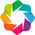

In [1]:
import warnings
warnings.filterwarnings('ignore')
import holoviews as hv
hv.extension('bokeh')
import hvplot.xarray,hvplot.pandas,stackstac
import xarray as xr
import numpy as np
import geopandas as gpd
from rasterio import features,transform
from pprint import pprint
from satsearch import Search

<a id='roi'></a>
### Step 1: Define the ROI

Read a shapefile of the USDA ARS LTAR Central Plains Experimental Range. This will be the region of interest (ROI) for this tutorial.

If you are new to geosptial data are not familiar with the idea of "projections", please see:  
Projections Tutorial: https://datacarpentry.org/organization-geospatial/03-crs/  
EPSG Site: https://epsg.io/

In [2]:
# Read the shapefile into the geopandas dataframe
cper_shp = gpd.read_file('https://raw.githubusercontent.com/rmg55/test_dashboard/master/data/cper.geojson')

# Get the bounds of the shapefile (ROI) in both espg:4326 (geographic - lat. and long.) and epsg:32613 (projected - cartesian coords. in meters)
#This bounding box will be used to find Sentinel Tiles that intersect with our ROI
cper_bnds_4326 = cper_shp.to_crs(4326).total_bounds

#This bounding box will be used to clip the Sentinel L2A tiles to the extent our our ROI 
cper_bnds_32613 = cper_shp.to_crs(32613).total_bounds

#Plot the shapefile/ROI
cper_shp.rename(columns = {'Past_Name_':'Pasture'}).hvplot(crs=32613,
                                                           alpha=.2,
                                                           line_alpha=1,
                                                           hover=True,
                                                           tiles='ESRI',
                                                           c='Pasture',
                                                           legend=False,
                                                           title='Central Plain Experimental Range',
                                                           frame_width=600)

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (Pasture)

<a id='stac_func'></a>
### Step 2: STAC Search Query Function

Define a function to Query a STAC catalog. Inputs are:
 - url of the catalog
 - dataset/collection
 - date range of interest
 - bounding box

In [3]:
def get_STAC_items(url, collection, dates, bbox):
    results = Search.search(url=url,
                            collections=collection,
                            datetime=dates,
                            bbox=bbox)
    return(results)

<a id='stac1'></a>
### Step 3: Query Sentinel 2 Catalog
- Selects from the catalog for MRGS tiles that interest our ROI (see step 1)
- Use the query results (python dictionary) to create an xarray object

Note that this is using a lazy-loading approach, where only the metadata is read from the files/stac catalog, rather than downloading the entire **7.52 TB** dataset.

In [4]:
# Define the parameters to search the STAC catalog
url = 'https://earth-search.aws.element84.com/v0'
collection = ['sentinel-s2-l2a-cogs']
bbox=list(cper_bnds_4326)
dates = '1901-01-01/2090-12-31' #Ge the entire data range of the data.

# Query the catalog
stac_items = get_STAC_items(url,collection,dates,bbox).items()

# Transform into an Xarray object
stackstac.stack(stac_items.geojson()['features'])

,Array,Chunk
Bytes,7.61 TiB,8.00 MiB
Shape,"(510, 17, 10980, 10980)","(1, 1, 1024, 1024)"
Count,1066531 Tasks,1049070 Chunks
Type,float64,numpy.ndarray


<a id='stac2'></a>
### Step 4: Query Sentinel 2 Catalog for 2019

- Selects from the catalog for MRGS tiles that interest our ROI (see step 1)
- Limit the data to scenes (MRGS tiles) to the year 2019 (e.g. 2019-01-01 - 2019-12-31).
- Use the query results (python dictionary) to create an xarray object. Subset to the Red, NIR, and QA bands.

The dataset is reduced to **396 GB** (from 7.52 TB) by subseting the data to 2019 and selecting the 3-bands of interest for our analysis.

In [5]:
# Define the parameters to search the STAC catalog
url = 'https://earth-search.aws.element84.com/v0'
collection = ['sentinel-s2-l2a-cogs']
bbox=list(cper_bnds_4326)
dates = '2019-01-01/2019-12-31' #Just 2019

# Query the catalog
stac_items = get_STAC_items(url,collection,dates,bbox).items()

# Lets look at a calendar
print(stac_items.calendar())

                              2019                              

      January               February               March        
Mo Tu We Th Fr Sa Su  Mo Tu We Th Fr Sa Su  Mo Tu We Th Fr Sa Su
    1  2  3  4  5  6               1  2  3               1  2  3  
 7  8  9 10 11 12 13   4  5  6  7  8  9 10   4  5  6  7  8  9 10  
14 15 16 17 18 19 20  11 12 13 14 15 16 17  11 12 13 14 15 16 17  
21 22 23 24 25 26 27  18 19 20 21 22 23 24  18 19 20 21 22 23 24  
28 29 30 31           25 26 27 28           25 26 27 28 29 30 31  

       April                  May                   June        
Mo Tu We Th Fr Sa Su  Mo Tu We Th Fr Sa Su  Mo Tu We Th Fr Sa Su
 1  2  3  4  5  6  7         1  2  3  4  5                  1  2  
 8  9 10 11 12 13 14   6  7  8  9 10 11 12   3  4  5  6  7  8  9  
15 16 17 18 19 20 21  13 14 15 16 17 18 19  10 11 12 13 14 15 16  
22 23 24 25 26 27 28  20 21 22 23 24 25 26  17 18 19 20 21 22 23  
29 30                 27 28 29 30 31        24 25 26 27 28 29 30  

  

In [6]:
# Lets examine a single asset (band) within a single STAC Item (date)
stac_dict = stac_items.geojson()
pprint(stac_dict['features'][0]['assets']['B04'])

{'href': 'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/13/T/EF/2019/12/S2B_13TEF_20191230_0_L2A/B04.tif',
 'proj:shape': [10980, 10980],
 'proj:transform': [10, 0, 499980, 0, -10, 4600020, 0, 0, 1],
 'title': 'Band 4 (red)',
 'type': 'image/tiff; application=geotiff; profile=cloud-optimized'}


In [7]:
# Transform into an Xarray object and read only the 3 bands we want (Red, NIR, and QA)
da = stackstac.stack(stac_dict['features'],assets=['B04','B08','SCL'])
da

,Array,Chunk
Bytes,396.13 GiB,8.00 MiB
Shape,"(147, 3, 10980, 10980)","(1, 1, 1024, 1024)"
Count,54364 Tasks,53361 Chunks
Type,float64,numpy.ndarray


<a id='subset'></a>
### Step 5: Subset and Mask to the CPER ROI

- Using the xarray object from Step 4, clip the xarray object to the ROI (CPER bounding box).
- Apply a mask using the CPER shapefile (pixels outside the shapefile will be changed to null).

The dataset is reduced to **3.05 GB** (from 396 GB) by clipping the data the bounding box of the ROI. Note that we use two functions to "mask" the data that falls within the ROI bounding box, but outside the domain (perimeter) of the CPER. The first function *xr_2_affine*, takes an xarray object, and calculates the affine transform (see nominclature section). The second function, *shp2mask*, rasterizes a shapefile (0's=outside and 1's=inside the shapefile) to match the same dimensions of the xarray object.

In [8]:
# Get the bounds in epsg:32613 and apply to the xarray object
minx,miny,maxx,maxy = cper_bnds_32613
da_cper = da.sel(x=slice(minx,maxx),y=slice(maxy,miny)).rename('CPER')
da_cper

,Array,Chunk
Bytes,3.06 GiB,3.25 MiB
Shape,"(147, 3, 965, 964)","(1, 1, 627, 680)"
Count,56128 Tasks,1764 Chunks
Type,float64,numpy.ndarray


In [9]:
# Function to calculate the affine transform from an xarray object
def xr_2_affine(ds):
    x_size = len(ds.x)
    y_size = len(ds.y)
    x_scale = np.abs(np.diff(ds.x).mean())
    y_scale = np.abs(np.diff(ds.y).mean())
    upperleft_x = ds.x.min() - x_scale
    upperleft_y = ds.y.max() + y_scale
    return(transform.Affine(x_scale,0.0,upperleft_x,0,-y_scale,upperleft_y))

# Define a function to mask the xarray object with a shapefile
def shp2mask(shp,xr_object,fill=0, **kwargs):
    raster = features.rasterize(shp, fill=fill,
                                transform=xr_2_affine(xr_object),
                                out_shape=xr_object.isel(time=0,band=0).cper.shape,
                                dtype='int16',
                                **kwargs)
    return xr.DataArray(raster,
                        coords=(xr_object.coords['y'].values,
                                xr_object.coords['x']),
                        dims=('y', 'x'))

In [10]:
### Create a Mask ###
# Convert DataArray to DataSet
da_cper = da_cper.to_dataset(name='cper')
# Create a single polygon to use as a mask
cper_shp_mask = cper_shp.dissolve().buffer(100).buffer(-100).geometry.values
# Add CPER mask (a DataArray) to the DataSet
da_cper['cper_mask'] = shp2mask(cper_shp_mask,da_cper)

# Apply the CPER mask and remap the data back to DataArray (from a DataSet)
da_cper = da_cper.cper.where(da_cper.cper_mask==1)

<a id='ndvi'></a>
### Step 6: Apply QA Band and Calculate NDVI

- Apply the QA band to the NIR and Red bands to remove "bad pixels" (i.e. clouds, water, snow, ice, etc...)
- Calculate the Normalized Differenced Vegetation Index (NDVI)

The dataset is reduced to **1.02 GB** by reducing the bands from red, nir, and QA/QC to just NDVI.

In [11]:
# Apply the QA band
mask = da_cper.sel(band='SCL').isin([4,5])
da_cper = da_cper.where(mask).sel(band=['B04','B08'])

# Calculate NDVI
Red = da_cper.sel(band='B04')
NIR = da_cper.sel(band='B08')
da_cper_ndvi = (NIR - Red) / (NIR + Red)
da_cper_ndvi = da_cper_ndvi.rename('NDVI')
da_cper_ndvi

<xarray.DataArray 'NDVI' (time: 147, y: 965, x: 964)>
dask.array<truediv, shape=(147, 965, 964), dtype=float64, chunksize=(1, 627, 680), chunktype=numpy.ndarray>
Coordinates: (12/21)
  * time                        (time) datetime64[ns] 2019-01-02T18:02:31 ......
    id                          (time) <U24 'S2A_13TEF_20190102_0_L2A' ... 'S...
  * x                           (x) float64 5.176e+05 5.176e+05 ... 5.272e+05
  * y                           (y) float64 4.524e+06 4.524e+06 ... 4.515e+06
    view:off_nadir              int64 0
    sentinel:latitude_band      <U1 'T'
    ...                          ...
    data_coverage               (time) object 88.62 94.05 88.4 ... None 93.85
    platform                    (time) <U11 'sentinel-2a' ... 'sentinel-2b'
    sentinel:sequence           (time) object None None None ... '0' '0' '0'
    instruments                 <U3 'msi'
    sentinel:grid_square        <U2 'EF'
    epsg                        int64 32613

<a id='plot'></a>
### Step 7: Explore and Plot

- Bring data to memory (e.g. download from AWS) using `.compute()`.
- Select a single time-step (2019-06-28) and plot the image.
- Select a single pixel to get a time-series and plot the time series.
- Calculate the average NDVI (across CPER) per time step and plot the time series.

In [12]:
# Bring data to memory (e.g. download from AWS)
# Depending on your internet speed, this can take 10's of seconds - ~ 5 minutes
da_cper_ndvi = da_cper_ndvi.compute()

In [13]:
# Query a single date / image
t = '2019-06-28'
da_cper_ndvi_plot = da_cper_ndvi.sel(time=t)

# Plot the image as well as the CPER shape file (showing pastures)
da_cper_ndvi_plot.squeeze().hvplot(x='x',
                                   y='y',
                                   tiles='ESRI',
                                   crs=32613,
                                   cmap='viridis',
                                   clim=(.15, .65),
                                   title='CPER NDVI on '+t,
                                   frame_width=600) * \
cper_shp.hvplot(crs=32613,
                alpha=0,
                line_alpha=1,
                hover=False)

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Image.I    :Image   [x,y]   (NDVI)
   .Polygons.I :Polygons   [Longitude,Latitude]

In [14]:
# Quey a single pixel, for all the time steps
da_cper_ndvi_ts = da_cper_ndvi.where(da_cper_ndvi>.1).isel(x=450,y=450).rename('NDVI')

# Plot the raw time series as well as a weekly max time series
pt_str = '(x='+str(int(da_cper_ndvi_ts.x.values))+',y='+str(int(da_cper_ndvi_ts.y.values))+')'
da_cper_ndvi_ts.hvplot(x='time',
                       kind='scatter',
                       title='NDVI '+pt_str,
                       width=500,
                       grid=True) + \
da_cper_ndvi_ts.groupby('time.weekofyear').max().hvplot(kind='scatter',
                                                        title='Weekly Max NDVI '+pt_str,
                                                        width=500,
                                                        grid=True)

:Layout
   .Scatter.I  :Scatter   [time]   (NDVI)
   .Scatter.II :Scatter   [weekofyear]   (NDVI)

In [15]:
# Get the mean for the entire Domain at each time step
da_cper_ndvi_tsall = da_cper_ndvi.where(da_cper_ndvi>.1).mean(dim=['x','y'])

# Plot the NDVI time series
da_cper_ndvi_tsall.hvplot(x='time',
                          kind='scatter',
                          title='Avg. NDVI across CPER',
                          grid=True,colorbar=True)

:Scatter   [time]   (NDVI)

**Concluding Remarks**:  A traditional workflow would involve downloading individual tiles that intersect the ROI, which for 2019, would be 396 GB, and then subsetting the data once it is in local storage. Assuming a download speed of 100 Mbps, this approach would take ~8.8 hours to simply download all the tiles. Here we have shown how to leverage a SpatioTemporal Asset Catalog to analyze EO data. The data is stored in Cloud Optimized Geotiffs (COGs), which allows efficient data access to particular chunks of the file (via http range requests). Using python packages that "lazily loading" the data, we are able to efficiently build out a workflow to subset, mask, and apply calculations (NDVI) before beginning the process of downloading the data. Finally, we "compute" the results into memory (Step 7), and are able to work with a much more managable dataset (1.0 GB).